In [1]:
import numpy as np
import pandas as pd

import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

sns.set()


In [2]:
from bokeh.io import output_notebook
from bokeh.plotting import figure, show
from bokeh.embed import file_html
from bokeh.resources import INLINE
output_notebook()

Loading BokehJS ...

In [3]:
import geopandas as gpd
import folium
# import folium.plugins
import pyproj
from pyproj import Transformer
source = "EPSG:32637"
target = "EPSG:4326"

In [4]:
map = folium.Map(location=[55.753818, 37.622628])

map

In [5]:
df =pd.read_csv('../input/geo/test.csv')
df.head()

!pip install pandas-profiling[notebook]

In [6]:
from pandas_profiling import ProfileReport
ProfileReport(df)



Summarize dataset:   0%|          | 0/24 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:
t =Transformer.from_crs(source,target)
lat,lon=t.transform(df['X'].to_numpy(),df['Y'].to_numpy())

In [8]:
np.vstack([lat,lon]).T.shape


(21817, 2)

In [9]:
df=df.sort_values('date time')

In [10]:
times =pd.to_datetime(df['date time'])

In [11]:
dt=times.diff().dt.total_seconds()

In [12]:
m=dt.mean()
d=dt.std()
dt2=dt[dt<m+3*d]

(array([2.1808e+04, 1.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00,
        3.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 2.0000e+00]),
 array([  0. ,  63.7, 127.4, 191.1, 254.8, 318.5, 382.2, 445.9, 509.6,
        573.3, 637. ]),
 <BarContainer object of 10 artists>)

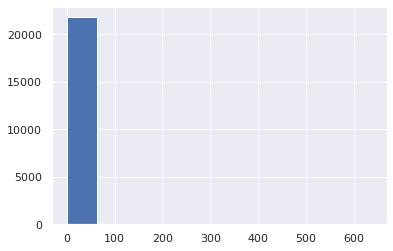

In [13]:
plt.hist(dt)

In [14]:
(dt>3).sum()

10

In [15]:
stop=np.concatenate([np.where(dt>1)[0],[dt.shape[0]]])

In [16]:
times.iloc[stop[:-1]].max()

Timestamp('2020-11-12 10:55:38')

In [17]:
colors=['blue','red','green','purple','pink','cyan','azure','#7FFFD4','#6A5ACD','#A5260A','#FFDC33']

In [18]:
idx=0
for i in range(stop.shape[0]):
    dt=times[idx:stop[i]].diff().dt.total_seconds()
    ds=np.sqrt(df['X'][idx:stop[i]].diff()**2+df['Y'][idx:stop[i]].diff()**2)
    dv=ds/dt
    N=10
    ds2=ds.groupby(ds.index // N).sum()
    dt2=dt.groupby(dt.index // N).sum()
    dv2=ds2/dt2
    # plt.plot(times[::N],dv2)
    # plt.gcf().autofmt_xdate()


    p = figure(title="Speed plot", x_axis_label='time', y_axis_label='speed m/s',x_axis_type='datetime')
    p.line([times.iloc[idx],times.iloc[stop[i]-1]],dv2.mean(), legend_label="Avg speed", line_width=3,color='black',line_dash='dashdot')
    # p.line(times[idx:stop[i]:N],dv2.mean(), legend_label="Avg speed", line_width=3,color='black',line_dash='dashdot')
    date_idx=times[idx:stop[i]:N]
    if date_idx.shape[0]<dv2.shape[0]:
        date_idx=np.concatenate([date_idx,[times[stop[i]-1]]])
    p.line(date_idx,dv2, legend_label="Speed", line_width=3,color=colors[i])

    html = file_html(p, INLINE, "my plot")
    iframe = folium.IFrame(html=html, width=600, height=600)
    popup = folium.Popup(iframe, max_width=600)

    folium.PolyLine(np.vstack([lat[idx:stop[i]],lon[idx:stop[i]]]).T, weight=2.5,color=colors[i],popup=popup).add_to(map)
    idx=stop[i]

map

In [19]:

dt=times.diff().dt.total_seconds()
ds=np.sqrt(df['X'].diff()**2+df['Y'].diff()**2)
dv=ds/dt
N=100

ds2=ds.groupby(ds.index // N).sum()
dt2=dt.groupby(dt.index // N).sum()
dv2=ds2/dt2
# plt.plot(times[::N],dv2)
# plt.gcf().autofmt_xdate()


p = figure(title="Speed plot", x_axis_label='time', y_axis_label='speed m/s',x_axis_type='datetime')
p.line([times.iloc[0],times.iloc[-1]],dv2.mean(), legend_label="Avg speed", line_width=2,color='black',line_dash='dashdot')
p.line(times[::N],dv2, legend_label="Speed", line_width=2,color=colors[-2])

show(p)